# **Re-implementation of [Unsupervised Representation Learning With Deep Convolutional Generative Adversarial Networks](https://arxiv.org/pdf/1511.06434.pdf)** (GANs) 


# Index
##  [Generative Adversarial Networks](#section-one)
   ### - [Architecture - GAN](#section-two)
   ###  - [Evaluation Metrics](#section-three)
##  [Deep Convolutional Generative Adversarial Networks](#section-four)
   ###  - [Architecture - DC-GAN](#section-five)
   ### - [Imports](#section-six)
   ###  - [Configuring dataset and dataloader](#section-seven)
   ### - [Intializing weights](#section-eight)
   ### - [Generator and Discriminator architecture](#section-nine)
   ### - [Generator code](#section-ten) 
   ### - [Discriminator code](#section-eleven) 
   ### - [Training](#section-twelve) 
   ### - [Results](#section-thirteen)
   ### - [Training Progression visualized](#section-fourteen)
   ### - [Real vs. Fake Images](#section-fifteen)



<a id="section-one"></a>
## [GANs](https://proceedings.neurips.cc/paper/2014/file/5ca3e9b122f61f8f06494c97b1afccf3-Paper.pdf) were introdued by Ian Goodfellow et al. as a new framework for estimating generative models via an adversarial process (inspired by  Game Theory).

![GAN-image](https://miro.medium.com/max/1276/1*YH3b1fARO-bf6gU3kyzT4A.jpeg)

<a id="section-two"></a>
## Architecture - GAN
### - The architecture of GANs consists of two models, a generator ($ G $) and a discriminator ($ D $), which are trained and run simultaneously to generate new data samples  
### - $ G $ takes a prior on input random latent variable, $ p_z(z) $ (noise) as input and outputs a new sample by learning the generator's distribution $ p_g $ over data $ x $ and then [*representing*](https://web.stanford.edu/class/cs231a/course_notes/07-representation-learning.pdf) a mapping to a data space as $ G(z; \theta_g) $
### - $ D $ has to differentiate between the sample coming from the real distribution and the generated distribution (akin to a binary classifier)
### The training procedure for $ G $ is to maximize the probability of $ D $  making a mistake
### - The training is done is using [backpropogation](https://www.youtube.com/watch?v=Ilg3gGewQ5U&ab_channel=3Blue1Brown) 


<a id="section-three"></a>
## Evaluation metrics
### -  A GAN can have two loss functions: one for generator training and one for discriminator training
### -  $ D(x) $  represents the probability that $ x $ came from the data rather than $ p_g $
### -  $ D $ is trained to maximize the probability of assigning the correct label to both training examples and samples from $ G $, log loss is used to see how close the prediction probability is to the corresponding actual/true value $ => log D(x) $
### -  $ G $ is simultaneously trained to minimize $ log(1 - D(G(z))) $ resulting in a two-player minimax game with a  [*value function*](https://en.wikipedia.org/wiki/Value_function) $ V(G,D) $
### $$ \min_{G}\max_{D}\mathbb{E}_{x\sim p_{\text{data}}(x)}[\log{D(x)}] +  \mathbb{E}_{z\sim p_{\text{z}}(z)}[1 - \log{D(G(z))}] $$
### - GANs although provided a new alternative to maximum likelihood estimation techniques for representation learning, were known to be unstable to train, randomly genererating nonsensical outputs


<a id="section-four"></a>
## [Deep Convolutional Generative Adversarial Networks](https://arxiv.org/pdf/1511.06434.pdf)
## DC-GANs were introduced by Alec et al. as a class of architectures that make GANs more stable to train in most settings

<a id="section-five"></a>
## **Architecture guidelines for DC-GANs**
### 1. All maxpooling (deterministic spatial upsampling & downsampling) layers are replaced by strided convolutional layers, $ i.e $ the mappings between high and low dimensional spaces of data are learnt by the system itself
### 2. All fully connected layers are eliminated for Convolutional features  (e.g. global average pooling layer has been shown to hurt convergence speed) except the first layer of $ G $ and the last layer of $ D $ which can be considered as otherwise
### 3. Batchnorm is used in both the $ G $ and $ D $
### 4. ReLU activation for all layers of $ G $ except output which uses Tanh
### 5. LeakyReLU activation is used in the $ D $ for all layers

In [1]:
%matplotlib inline

<a id="section-six"></a>
## Imports

In [2]:
from __future__ import print_function
#%matplotlib inline
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Set random seed for reproducibility
manualSeed = 250
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Random Seed:  250


<a id="section-seven"></a>
## [Configuring Dataset and Dataloader](https://pytorch.org/tutorials/beginner/basics/data_tutorial.html)
### The dataset used is the [Large-scale CelebFaces Attributes (CelebA) Dataset](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) , download the file named [img_align_celeba.zip](https://drive.google.com/file/d/0B7EVK8r0v71pZjFTYXZWM3FlRnM/view?usp=sharing&resourcekey=0-dYn9z10tMJOBAkviAcfdyQ) 
### Loading the data directory according to structure of the [ImageFolder pytorch class](http://pytorch.org/vision/main/generated/torchvision.datasets.ImageFolder.html)

### The hyper-parameters (batch size, image size, latent vector size, feature maps in generator and discriminator, learning rate and adam optimizer) are from the [conference paper]((https://arxiv.org/pdf/1511.06434.pdf))

In [3]:
# Root directory for dataset
dataroot = "../input/GAN-images/"

# Number of workers for dataloader
workers = 2

# Batch size during training
batch_size = 128

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 64

# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 5

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1


## Create PyTorch dataloader and set the device, the dataset is pre-processed to reduce variance and a sample batch of training images are shown 


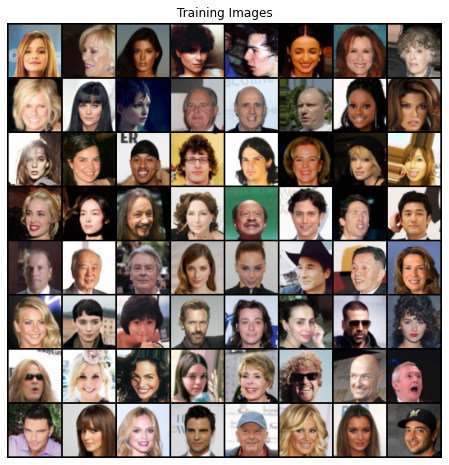

In [4]:
# Create the dataset
dataset = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))
# Create the dataloader
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

<a id="section-eight"></a>
## Initialization of weights 
### All model weights shall be randomly initialized from a Normal distribution with mean=0, stdev=0.02 as the authors specify

In [5]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

<a id="section-nine"></a>
## Generator and Discriminator architecture 

![](https://www.researchgate.net/publication/343597759/figure/fig4/AS:923532934529034@1597198818441/The-architecture-of-the-generator-and-the-discriminator-in-a-DCGAN-model-FSC-is-the.ppm)

<a id="section-ten"></a>
## Generator code

In [6]:
# Generator Code

class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh() 
            # state size. (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)

In [7]:
# Create the generator
netG = Generator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.02.
netG.apply(weights_init)

# Print the model
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


<a id="section-eleven"></a>
## Discriminator code 

In [8]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [9]:
# Create the Discriminator
netD = Discriminator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))
    
# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netD.apply(weights_init)

# Print the model
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


## Initializing loss function

In [10]:
# Initialize BCELoss function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

<a id="section-twelve"></a>
## Training 
### Practically,the Discriminator is trained to maximize $ log(D(x)) + log(1 - D(G(z))) $. First a mini-batch of real images are forward passed to the $ D $ to calculate loss $ log(D(x)) $, a mini-batch of fake samples from $ G $ are passed to the $ D $ to calculate loss $ log(1 - D(G(z)) $, gradients in both batches are accumulated in the respective backward pass 
### For training the Generator, $ log(D(G(z)) $ is maximized

## The training statistics reported are:

* #### ***Loss_D*** - discriminator loss calculated as the sum of losses for the all real and all fake batches $ (log(D(x)) + log(1 - D(G(z)))log(D(x))+log(1−D(G(z))) $
* #### ***Loss_G*** - generator loss calculated as  $ log(D(G(z))) $
* #### ***D(x)*** - the average output (across the batch) of the discriminator for the all real batches
* #### ***D(G(z))*** - the average discriminator outputs for the all fake batches

In [11]:
# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(dataloader, 0):
        
        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Compute error of D as sum over the fake and the real batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()
        
        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))
        
        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())
        
        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
            
        iters += 1

Starting Training Loop...
[0/5][0/1583]	Loss_D: 1.9185	Loss_G: 5.6200	D(x): 0.6423	D(G(z)): 0.7028 / 0.0060
[0/5][50/1583]	Loss_D: 0.3291	Loss_G: 33.8138	D(x): 0.8734	D(G(z)): 0.0000 / 0.0000
[0/5][100/1583]	Loss_D: 0.4522	Loss_G: 7.4518	D(x): 0.8887	D(G(z)): 0.1911 / 0.0011
[0/5][150/1583]	Loss_D: 0.7007	Loss_G: 7.0288	D(x): 0.8718	D(G(z)): 0.3447 / 0.0030
[0/5][200/1583]	Loss_D: 0.3558	Loss_G: 6.4915	D(x): 0.8531	D(G(z)): 0.1234 / 0.0025
[0/5][250/1583]	Loss_D: 0.6558	Loss_G: 5.3548	D(x): 0.6267	D(G(z)): 0.0128 / 0.0119
[0/5][300/1583]	Loss_D: 0.4542	Loss_G: 2.9977	D(x): 0.7551	D(G(z)): 0.0771 / 0.0885
[0/5][350/1583]	Loss_D: 0.6805	Loss_G: 5.3845	D(x): 0.9279	D(G(z)): 0.3986 / 0.0104
[0/5][400/1583]	Loss_D: 0.5176	Loss_G: 5.7197	D(x): 0.9640	D(G(z)): 0.3116 / 0.0076
[0/5][450/1583]	Loss_D: 0.3044	Loss_G: 5.4970	D(x): 0.9577	D(G(z)): 0.1989 / 0.0098
[0/5][500/1583]	Loss_D: 0.6736	Loss_G: 4.4372	D(x): 0.7947	D(G(z)): 0.2534 / 0.0180
[0/5][550/1583]	Loss_D: 3.1260	Loss_G: 6.8494	D(x): 

<a id="section-thirteen"></a>
## Results

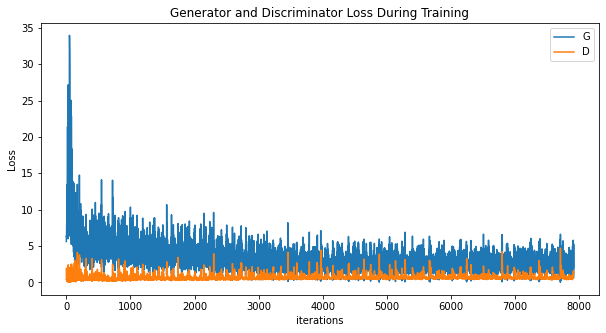

In [12]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

<a id="section-fourteen"></a>
## Generator's progression shows a visualization of the training process, emperically showing how the system learns over epochs 

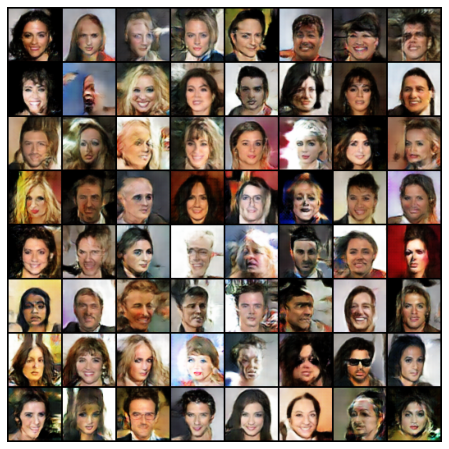

In [13]:
#%%capture
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

<a id="section-fifteen"></a>
## Real Images vs. Fake Images

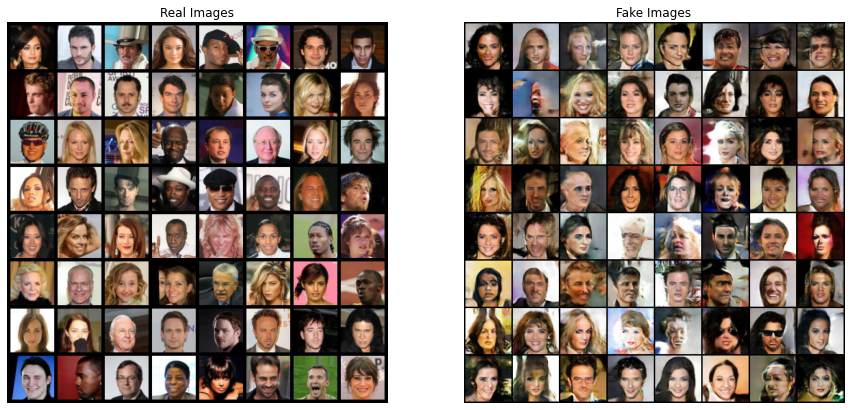

In [14]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()